# Explore the dataset


In this notebook, we will perform an EDA (Exploratory Data Analysis) on the processed Waymo dataset (data in the `processed` folder). In the first part, you will create a function to display 

In [1]:
from utils import get_dataset
import glob
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from matplotlib.patches import Rectangle
import numpy as np
import tensorflow as tf

%matplotlib inline

In [2]:
dataset = get_dataset("/home/workspace/data/train/*.tfrecord")

INFO:tensorflow:Reading unweighted datasets: ['/home/workspace/data/train/*.tfrecord']
INFO:tensorflow:Reading record datasets for input file: ['/home/workspace/data/train/*.tfrecord']
INFO:tensorflow:Number of filenames to read: 86
Instructions for updating:
Use `tf.data.Dataset.interleave(map_func, cycle_length, block_length, num_parallel_calls=tf.data.experimental.AUTOTUNE)` instead. If sloppy execution is desired, use `tf.data.Options.experimental_deterministic`.
Instructions for updating:
Use `tf.data.Dataset.map()


## Write a function to display an image and the bounding boxes

Implement the `display_images` function below. This function takes a batch as an input and display an image with its corresponding bounding boxes. The only requirement is that the classes should be color coded (eg, vehicles in red, pedestrians in blue, cyclist in green).

In [3]:
def display_instances(batch):
    """
    This function takes a batch from the dataset and display the image with 
    the associated bounding boxes.
    """
    colormap = {1:[1, 0, 0], 2:[0, 1, 0], 4:[0, 0, 1]}

    # display the image
    fig, ax = plt.subplots(3, 4, figsize=(40, 30))
    for i, data in enumerate(batch):
        row = i % 3
        col = i // 3
        img = data['image'].numpy()
        ax[row, col].imshow(img)
        
        bboxes = data['groundtruth_boxes'].numpy()
        classes = data['groundtruth_classes'].numpy()
        
        # draw bounding boxes and add colors to objects with different class labels
        for cl, bb in zip(classes, bboxes):
            x, y = bb[1]*img.shape[1], bb[0]*img.shape[0]
            width = (bb[3] - bb[1])*img.shape[1]
            height = (bb[2] - bb[0])*img.shape[0]
            rec = Rectangle((x, y), width, height, facecolor='none',
                            edgecolor = colormap[cl])
            ax[row, col].add_patch(rec)
        ax[row, col].axis('off')
    plt.tight_layout()
    plt.show()

## Display 10 images 

Using the dataset created in the second cell and the function you just coded, display 10 random images with the associated bounding boxes. You can use the methods `take` and `shuffle` on the dataset.

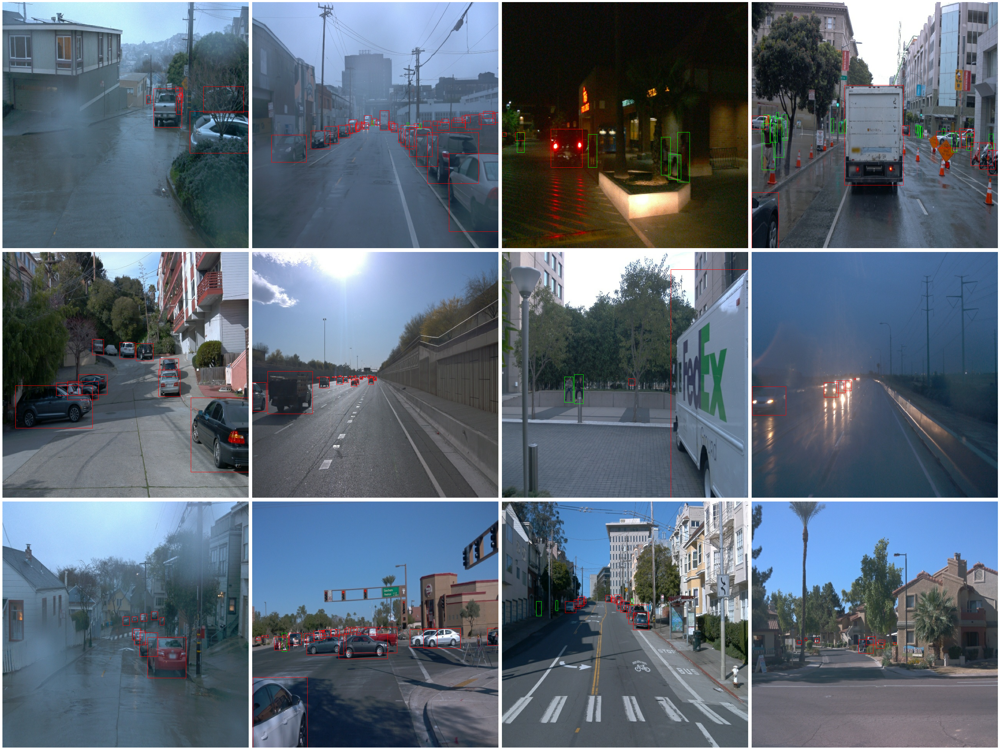

In [16]:
# Display 10 random images in dataset
display_instances(dataset.shuffle(80, reshuffle_each_iteration=True).take(12))

## Additional EDA

In this last part, you are free to perform any additional analysis of the dataset. What else would like to know about the data?
For example, think about data distribution. So far, you have only looked at a single file...

In [17]:
import seaborn as sns

In [18]:
label_counts = {1: 0, 2: 0, 4: 0}
label_dist = {1: [], 2: [], 4: []}

In [19]:
for batches in dataset.take(10000):
    batch_count = {1: 0, 2: 0, 4: 0}
    for cl in batches['groundtruth_classes'].numpy():
        label_counts[cl] += 1
        batch_count[cl] += 1
    label_dist[1].append(batch_count[1])
    label_dist[2].append(batch_count[2])
    label_dist[4].append(batch_count[4])
    
class_counts = {'cars': label_counts[1], 'pedestrians': label_counts[2], 'cyclists': label_counts[4]}
class_dist = {'cars': label_dist[1], 'pedestrians': label_dist[2], 'cyclists': label_dist[4]}

/root/miniconda3/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


[Text(0.5, 0, 'Classes'),
 Text(0, 0.5, 'Number of occurences'),
 Text(0.5, 1.0, 'Occurences of classes for 10000 random images')]

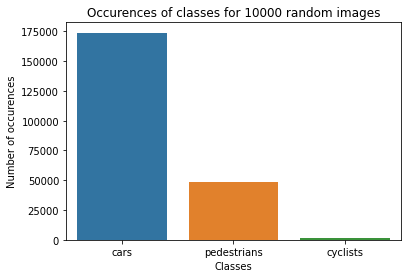

In [20]:
classes = list(class_counts.keys())
counts = [class_counts[i] for i in classes]

ax = sns.barplot(classes, counts)
ax.set(xlabel='Classes', ylabel='Number of occurences', title='Occurences of classes for 10000 random images')


[Text(0.5, 0, 'Number of cars per image'),
 Text(0, 0.5, 'Number of images'),
 Text(0.5, 1.0, 'Distribution of numbers of cars')]

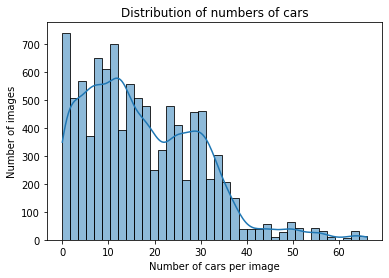

In [21]:
car_plot = sns.histplot(class_dist['cars'], kde=True)
car_plot.set(xlabel='Number of cars per image', ylabel='Number of images', title='Distribution of numbers of cars')

[Text(0.5, 0, 'Number of pedestrians per image'),
 Text(0, 0.5, 'Number of images'),
 Text(0.5, 1.0, 'Distribution of numbers of pedestrians')]

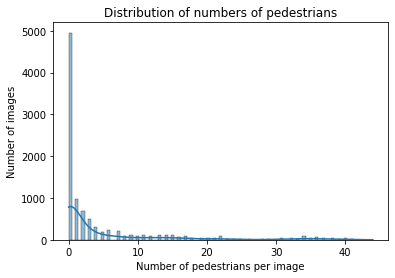

In [22]:
ped_plot = sns.histplot(class_dist['pedestrians'], kde=True)
ped_plot.set(xlabel='Number of pedestrians per image', ylabel='Number of images', title='Distribution of numbers of pedestrians')

[Text(0.5, 0, 'Number of cyclists per image'),
 Text(0, 0.5, 'Number of images'),
 Text(0.5, 1.0, 'Distribution of numbers of cyclists')]

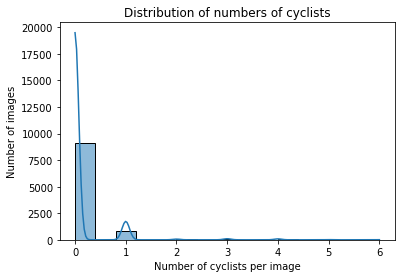

In [23]:
cyc_plot = sns.histplot(class_dist['cyclists'], kde=True)
cyc_plot.set(xlabel='Number of cyclists per image', ylabel='Number of images', title='Distribution of numbers of cyclists')